In [1]:
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pickle

In [2]:
print(torch.cuda.is_available())

True


In [3]:
# Проверяем, доступны ли GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [7]:
# Загрузка DataFrame из файла
with open(r'../datasets/dataset.pkl', 'rb') as f:
    df = pickle.load(f)

In [8]:
crystal = df['Crystal']
Crystal = []

for i in crystal:
    i = i[1:]
    foo, fooo = i.split(".")
    i = foo
    #print(i)
    Crystal.append(i)

In [9]:
df['Crystal'] = Crystal
print(df['Crystal'].unique())
print(df['Stats'].unique())

['Ag' 'Al' 'Al2O3_sapphire' 'Au' 'B4C' 'Ba' 'Be' 'BeO' 'C_diamond'
 'C_graphite' 'Cr' 'Cs' 'Cu' 'Cu2MnAl' 'Fe' 'Ga' 'Gd' 'Ge' 'H2O_ice_1h'
 'He4_hcp' 'Hg' 'I2' 'K' 'Li' 'LiF' 'Mo' 'Na2Ca3Al2F14' 'Nb' 'Ni' 'Pb'
 'Pt' 'Rb' 'Si' 'Ti' 'Tl' 'UO2' 'Zn' 'Y2O3']
[1.e+07 2.e+07 5.e+07 1.e+08 2.e+08 5.e+08]


In [10]:
# Определяем целевые значения
target_crystals = ['Al', 'Al2O3_sapphire', 'Ba', 'Be', 'BeO', 'C_diamond',
                  'C_graphite', 'Cr', 'Cs', 'Cu', 'Cu2MnAl', 'Fe', 'Ga', 'Ge',
                  'He4_hcp', 'I2', 'K', 'Mo', 'Na2Ca3Al2F14', 'Nb', 'Ni', 'Pb', 'Pt',
                  'Rb', 'Si', 'Ti', 'Tl', 'UO2', 'Zn', 'Y2O3']

target_stats = [2.e+08, 5.e+08]

# Применяем фильтрацию к исходному датафрейму
df = df[
    df['Crystal'].isin(target_crystals) & 
    df['Stats'].isin(target_stats)
]
df = df.reset_index(drop= True)

In [11]:
# Загрузка DataFrame из файла
with open(r'../datasets/segmentation_maps.pkl', 'rb') as f:
    df_seg_maps = pickle.load(f)

In [12]:
tesr_samples = ['Al2O3_sapphire', 'C_graphite', 'Na2Ca3Al2F14', 'Rb', 'Si', 'UO2']

maxStats = 5.e+08
maxI = max(df['Pulce duration'].unique())

df_test = df[
    df['Crystal'].isin(tesr_samples) & 
    df['Stats'].isin([5.e+08]) & 
    df['Pulce duration'].isin([maxI])
]
df_test = df_test.reset_index(drop= True)

# Преобразование матриц в numpy массив перед преобразованием в тензоры
df_test_matrices = np.array(df_test['Matrix'].tolist())

# Преобразование данных в тензоры PyTorch
df_test_tensor = torch.FloatTensor(df_test_matrices)
df_test_tensor = df_test_tensor.unsqueeze(1)
df_test_tensor = df_test_tensor.to(device)
print(df_test_tensor.size())

df_test_GT = df_seg_maps[
    df_seg_maps['Crystal'].isin(tesr_samples)
]
df_test_GT = df_test_GT.reset_index(drop= True)

# Преобразование матриц в numpy массив перед преобразованием в тензоры
GT_test_matrices = np.array(df_test_GT['Mask'].tolist())

# Преобразование данных в тензоры PyTorch
GT_test_tensor = torch.FloatTensor(GT_test_matrices)
GT_test_tensor = GT_test_tensor.unsqueeze(1)
GT_test_tensor = GT_test_tensor.to(device)
print(GT_test_tensor.size())

torch.Size([6, 1, 250, 480])
torch.Size([6, 1, 250, 480])


In [14]:
import torch
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

class DiffractionDataset(Dataset):
    def __init__(self, df, df_seg_matrices, transform=None, crystal_list=None):
        """
        Args:
            df: DataFrame с экспериментальными данными
            df_seg_matrices: DataFrame с масками сегментации
            transform: преобразования для изображений и масок
            crystal_list: список кристаллических структур для этого датасета
        """
        self.df = df.reset_index(drop=True)
        self.df_seg_matrices = df_seg_matrices
        self.transform = transform
        
        # Если указан список кристаллов, фильтруем данные
        if crystal_list is not None:
            self.df = self.df[self.df['Crystal'].isin(crystal_list)].copy().reset_index(drop=True)
        
        # Создаем словарь для быстрого доступа к маскам
        self.mask_dict = {}
        mask_df = df_seg_matrices.set_index('Crystal')
        for crystal in mask_df.index.unique():
            mask = mask_df.loc[crystal, 'Mask']
            if isinstance(mask, pd.Series):
                mask = mask.iloc[0]  # Берем первую маску если их несколько
            self.mask_dict[crystal] = mask
            
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        # Получаем данные из df
        row = self.df.iloc[idx]
        crystal = row['Crystal']
        
        # Загружаем дифракционное изображение
        image = row['Matrix']
        
        # Получаем соответствующую маску
        mask = self.mask_dict[crystal]
        
        # Преобразуем в тензоры
        if not isinstance(image, torch.Tensor):
            image = torch.from_numpy(np.array(image)).float()
        if not isinstance(mask, torch.Tensor):
            mask = torch.from_numpy(np.array(mask)).long()
            
        # Добавляем channel dimension для изображения
        if len(image.shape) == 2:
            image = image.unsqueeze(0)  # [1, H, W]
            
        # Применяем преобразования если есть
        if self.transform:
            image, mask = self.transform(image, mask)
            
        return image, mask

# Функции для разных стратегий разделения

def split_by_crystal_stratified(df, test_size=0.2, random_state=42):
    """
    Стратегия 1: Разделяет данные так, чтобы кристаллические структуры в тесте 
    не пересекались с трейном (полное разделение по кристаллам)
    """
    # Получаем уникальные кристаллические структуры
    unique_crystals = df['Crystal'].unique()
    
    # Разделяем кристаллы на train и test
    train_crystals, test_crystals = train_test_split(
        unique_crystals, 
        test_size=test_size, 
        random_state=random_state,
        shuffle=True
    )
    
    # Создаем train и test датафреймы
    train_df = df[df['Crystal'].isin(train_crystals)].copy()
    test_df = df[df['Crystal'].isin(test_crystals)].copy()
    
    print(f"Стратегия: Разделение по кристаллам (без пересечений)")
    print(f"Train crystals ({len(train_crystals)}): {train_crystals}")
    print(f"Test crystals ({len(test_crystals)}): {test_crystals}")
    print(f"Train samples: {len(train_df)}")
    print(f"Test samples: {len(test_df)}")
    
    return train_df, test_df, train_crystals, test_crystals

def split_simple_stratified(df, test_size=0.2, random_state=42, stratify_by_crystal=True):
    """
    Стратегия 2: Простое разделение, где каждый кристалл может быть и в трейне и в тесте
    
    Args:
        stratify_by_crystal: если True, стратифицируем по кристаллам
    """
    if stratify_by_crystal:
        # Стратифицируем по кристаллам для сбалансированного разделения
        train_df, test_df = train_test_split(
            df,
            test_size=test_size,
            random_state=random_state,
            stratify=df['Crystal'],  # Стратификация по кристаллам
            shuffle=True
        )
    else:
        # Простое случайное разделение
        train_df, test_df = train_test_split(
            df,
            test_size=test_size,
            random_state=random_state,
            shuffle=True
        )
    
    # Получаем уникальные кристаллы в каждой выборке
    train_crystals = train_df['Crystal'].unique()
    test_crystals = test_df['Crystal'].unique()
    
    # Находим пересечение кристаллов
    intersection = set(train_crystals) & set(test_crystals)
    
    print(f"Стратегия: Простое разделение (с пересечениями)")
    print(f"Train crystals ({len(train_crystals)}): {len(train_crystals)} уникальных")
    print(f"Test crystals ({len(test_crystals)}): {len(test_crystals)} уникальных")
    print(f"Пересечение кристаллов: {len(intersection)} общих кристаллов")
    print(f"Train samples: {len(train_df)}")
    print(f"Test samples: {len(test_df)}")
    
    # Для совместимости возвращаем train_crystals и test_crystals
    return train_df, test_df, train_crystals, test_crystals

def split_data(df, strategy='crystal', test_size=0.2, random_state=42, **kwargs):
    """
    Основная функция разделения данных с выбором стратегии
    
    Args:
        df: DataFrame с данными
        strategy: стратегия разделения
            - 'crystal': разделение по кристаллам (без пересечений)
            - 'simple': простое разделение (с пересечениями)
        test_size: доля тестовой выборки
        random_state: seed для воспроизводимости
        **kwargs: дополнительные аргументы для стратегий
    
    Returns:
        train_df, test_df, train_crystals, test_crystals
    """
    if strategy == 'crystal':
        return split_by_crystal_stratified(df, test_size, random_state)
    elif strategy == 'simple':
        stratify_by_crystal = kwargs.get('stratify_by_crystal', True)
        return split_simple_stratified(df, test_size, random_state, stratify_by_crystal)
    else:
        raise ValueError(f"Неизвестная стратегия: {strategy}. Используйте 'crystal' или 'simple'")

In [15]:
def create_dataloaders(df, df_seg_matrices, batch_size=32, test_size=0.2, 
                       shuffle=True, num_workers=0, random_state=42,
                       split_strategy='crystal', **split_kwargs):
    """
    Создает DataLoader'ы с выбором стратегии разделения
    
    Args:
        split_strategy: стратегия разделения
            - 'crystal': разделение по кристаллам (без пересечений)
            - 'simple': простое разделение (с пересечениями)
        split_kwargs: дополнительные аргументы для стратегии разделения
    """
    print(f"\n{'='*60}")
    print(f"Создание DataLoader'ов со стратегией: {split_strategy}")
    print(f"{'='*60}")
    
    # Разделяем данные согласно выбранной стратегии
    train_df, test_df, train_crystals, test_crystals = split_data(
        df, 
        strategy=split_strategy,
        test_size=test_size, 
        random_state=random_state,
        **split_kwargs
    )
    
    # Создаем датасеты
    train_dataset = DiffractionDataset(
        train_df, 
        df_seg_matrices, 
        transform=None,
        crystal_list=None  # Не фильтруем по crystal_list для простого разделения
    )
    
    test_dataset = DiffractionDataset(
        test_df, 
        df_seg_matrices, 
        transform=None,
        crystal_list=None
    )
    
    # Определяем параметры для DataLoader
    loader_kwargs = {
        'batch_size': batch_size,
        'shuffle': shuffle,
        'pin_memory': True if torch.cuda.is_available() else False
    }
    
    # Добавляем num_workers только если он > 0
    if num_workers > 0:
        loader_kwargs['num_workers'] = num_workers
        loader_kwargs['persistent_workers'] = True if num_workers > 0 else False
    
    # Создаем DataLoader'ы
    train_loader = DataLoader(train_dataset, **loader_kwargs)
    
    # Для test_loader отключаем shuffle
    loader_kwargs['shuffle'] = False
    test_loader = DataLoader(test_dataset, **loader_kwargs)
    
    return train_loader, test_loader, train_crystals, test_crystals

In [16]:
# Создаем DataLoader'ы
train_loader, test_loader, train_crystals, test_crystals = create_dataloaders(
    df=df,
    df_seg_matrices=df_seg_maps,
    batch_size=4,
    test_size=0.2,
    shuffle=True,
    random_state=42,
    split_strategy='simple' # 'crystal' 'simple'
)

# Проверяем размерность батча
for diffractions, masks in train_loader:
    print(f"Images shape: {diffractions.shape}")  # [batch_size, 1, H, W]
    print(f"Masks shape: {masks.shape}")    # [batch_size, H, W]

    break


Создание DataLoader'ов со стратегией: simple
Стратегия: Простое разделение (с пересечениями)
Train crystals (30): 30 уникальных
Test crystals (30): 30 уникальных
Пересечение кристаллов: 30 общих кристаллов
Train samples: 960
Test samples: 240
Images shape: torch.Size([4, 1, 250, 480])
Masks shape: torch.Size([4, 250, 480])


In [17]:
from SwinUNet import SwinUNet


old_state = torch.load(
    "../models/SwinUnet_binary_segmentation_diffraction.pth",
    map_location=device
)

new_state = {}

for k, v in old_state.items():
    if k.startswith("encoder.patch_embed."):
        # переносим patch_embed на верхний уровень
        new_key = k.replace("encoder.patch_embed.", "patch_embed.")
    else:
        new_key = k

    new_state[new_key] = v

# Создание модели
segmentator = SwinUNet(patch_size=2, in_chans=1, embed_dim=48, depths=[2, 2, 2, 2], num_heads=[3, 6, 12, 24],
                 window_size=5, mlp_ratio=4., qkv_bias=True, drop=0., attn_drop=0., drop_path=0.).to(device)


missing, unexpected = segmentator.load_state_dict(new_state, strict=False)

print("Missing keys:", missing)
print("Unexpected keys:", unexpected)

Missing keys: []
Unexpected keys: []


In [14]:
from SwinUNet import SwinUNetSR


patch_state = {}

for k, v in old_state.items():
    if k.startswith("encoder.patch_embed."):
        new_key = k.replace("encoder.patch_embed.", "")
        patch_state[new_key] = v

upscaler = SwinUNetSR(patch_size=2, in_chans=1, embed_dim=48, depths=[2, 2, 2, 2], num_heads=[3, 6, 12, 24],
                 window_size=5, mlp_ratio=4., qkv_bias=True, drop=0., attn_drop=0., drop_path=0.).to(device)

upscaler.patch_embed.load_state_dict(patch_state)

for param in upscaler.patch_embed.parameters():
    param.requires_grad = False

for name, param in upscaler.named_parameters():
    if "patch_embed" in name:
        print(name, param.requires_grad)

test_lr = torch.randn(2, 1, 125, 240).to(device)

upscaler.eval()

with torch.no_grad():
    out_lr = upscaler(test_lr)

print(out_lr.size())

patch_embed.proj.weight False
patch_embed.proj.bias False
patch_embed.norm.weight False
patch_embed.norm.bias False
torch.Size([2, 1, 250, 480])


In [12]:
def normalize_piecewise(x, threshold=0.01, eps=1e-6):
    """
    x: [B, 1, H, W] tensor after convolution
    returns:
        x_norm: normalized tensor
        params: dict with all values needed for denormalization
    """
    # per-image min/max
    x_min = x.amin(dim=(2, 3), keepdim=True)
    x_max = x.amax(dim=(2, 3), keepdim=True)

    # scale to [0, 1]
    x01 = (x - x_min) / (x_max - x_min + eps)

    # piecewise: weak intensities linear, strong -> logarithmic compression
    mask = x01 > threshold

    # log transform only strong pixels
    x_strong = torch.log1p(x01) / torch.log1p(torch.tensor(1.0))

    # combine back
    x_norm = torch.where(mask, x_strong, x01)

    params = {
        'x_min': x_min,
        'x_max': x_max,
        'threshold': threshold
    }

    return x_norm, params

def denormalize_piecewise(x_norm, params, eps=1e-6):
    """
    x_norm: normalized output of upscaler
    params: dict returned by normalize_piecewise
    """
    x_min = params['x_min']
    x_max = params['x_max']
    threshold = params['threshold']

    # Split strong and weak regions
    mask = x_norm > threshold

    # inverse log for strong pixels
    x_strong = torch.expm1(x_norm)

    # combine back
    x01 = torch.where(mask, x_strong, x_norm)

    # rescale back to original dynamic range
    x = x01 * (x_max - x_min + eps) + x_min
    return x


In [13]:
from peak_loss import DiffractionPipeline
import torch.nn.functional as F

# ---------------- Losses (same as earlier + small improvements) ----------------
def l1_loss(pred, target):
    return F.l1_loss(pred, target)

fixed_centers_hr = np.linspace(0.05318052, 7.49710258, 1241)
fixed_centers_lr = np.linspace(0.0546658, 7.49180085, 832)

pipe = DiffractionPipeline(
    fixed_centers_pred=fixed_centers_hr,
    fixed_centers_true=fixed_centers_lr,
    device=device
)

In [19]:
from torch.optim.lr_scheduler import CosineAnnealingLR
import math

# Планировщик с косинусным затуханием и warmup
def get_scheduler(optimizer, warmup_epochs, total_epochs, base_lr):
    def lr_lambda(epoch):
        if epoch < warmup_epochs:
            # Linear warmup
            return (epoch + 1) / warmup_epochs
        else:
            # Cosine annealing
            progress = (epoch - warmup_epochs) / (total_epochs - warmup_epochs)
            return 0.5 * (1 + math.cos(math.pi * progress))
    
    return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)

# Попробуйте такую конфигурацию:
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, upscaler.parameters()),
    lr=2e-4,  # Чуть выше начальный LR
    betas=(0.9, 0.999),
    eps=1e-8,  # Стандартное значение
    weight_decay=1e-4  # Увеличьте weight decay для лучшей регуляризации
)

# Использование:
scheduler = get_scheduler(optimizer, warmup_epochs=10, total_epochs=300, base_lr=1e-4)

In [28]:
from tqdm import tqdm
from torch.cuda.amp import autocast, GradScaler

def train_epoch(segmentator, upscaler, train_loader, val_loader, optimizer, scheduler, device, scaler, epoch_num, num_epochs, use_fp16, lambda_phys=1.0):
    upscaler.train()
    segmentator.eval()
    total_loss_train = 0.0
    total_loss_l1_train = 0.0
    total_peaks_loss_train = 0.0

    total_loss_test = 0.0
    total_loss_l1_test = 0.0
    total_peaks_loss_test = 0.0
    for hr, _ in tqdm(train_loader, desc=f"Epoch {epoch_num+1} Train", leave=False):
        hr = hr.to(device)

        mu = 100
        sigma = 0.2*mu
        
        # Создаем шум на том же устройстве
        noise = torch.randn_like(hr, device=device) * sigma + mu
        hr = hr + noise

        with torch.no_grad():
            if use_fp16:
                # FP16 forward
                with autocast():
                    pred = segmentator(hr)
                    pred = torch.sigmoid(pred)       
            else:
                pred = segmentator(hr)
                pred = torch.sigmoid(pred)

        hr = pred * hr

        lr = F.interpolate(
            hr, 
            scale_factor=0.5, 
            mode='bilinear', 
            align_corners=False
        )  # размер: [32, 1, 125, 240]
        
        norm_lr, params_lr = normalize_piecewise(lr)

        norm_hr, params_hr = normalize_piecewise(hr)

        optimizer.zero_grad()

        if use_fp16:
            # FP16 forward
            with autocast():
                pred = upscaler(norm_lr.to(device))  # pred shape B,1,250*scale? model uses scale, so pred is HR sized
                # ensure shapes match
                # If pred size differs, you may need to crop/pad depending on patch_size
                rec = l1_loss(pred, norm_hr.to(device))
                denorm_pred = denormalize_piecewise(pred, params_hr)

                loss_peaks = pipe(
                    batch_pred_2d=denorm_pred,     # предсказанная 2D дифракция
                    batch_true_2d=lr,     # ground-truth 2D
                    peak_params_pred={"scale": True},
                    peak_params_true={"scale": False},
                    tol=0.05
                )
                if rec.item() >= 0.06:
                    loss = rec
                else:
                    loss = rec + lambda_phys * loss_peaks
            
            # Масштабируем градиенты и делаем backward
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

        else:
            # FP32 forward
            pred = upscaler(norm_lr.to(device))  # pred shape B,1,250*scale? model uses scale, so pred is HR sized
            # ensure shapes match
            # If pred size differs, you may need to crop/pad depending on patch_size
            rec = l1_loss(pred, norm_hr.to(device))
            denorm_pred = denormalize_piecewise(pred, params_hr)

            loss_peaks = pipe(
                batch_pred_2d=denorm_pred,     # предсказанная 2D дифракция
                batch_true_2d=lr,     # ground-truth 2D
                peak_params_pred={"scale": True},
                peak_params_true={"scale": False},
                tol=0.05
            )
            if rec.item() >= 0.06:
                loss = rec
            else:
                loss = rec + lambda_phys * loss_peaks

            loss.backward()
            optimizer.step()

        total_loss_train += loss.item()
        total_loss_l1_train += rec.item()
        total_peaks_loss_train += loss_peaks.item()


    # Валидация
    upscaler.eval()

    for hr, _ in tqdm(val_loader, desc=f"Epoch {epoch_num+1} Val", leave=False):
        hr = hr.to(device)

        mu = 100
        sigma = 0.2*mu
        
        # Создаем шум на том же устройстве
        noise = torch.randn_like(hr, device=device) * sigma + mu
        hr = hr + noise

        with torch.no_grad():
            if use_fp16:
                # FP16 forward
                with autocast():
                    pred = segmentator(hr)
                    pred = torch.sigmoid(pred)       
            else:
                pred = segmentator(hr)
                pred = torch.sigmoid(pred)

        hr = pred * hr

        lr = F.interpolate(
            hr, 
            scale_factor=0.5, 
            mode='bilinear', 
            align_corners=False
        )  # размер: [32, 1, 125, 240]
        
        norm_lr, params_lr = normalize_piecewise(lr)

        norm_hr, params_hr = normalize_piecewise(hr)

        if use_fp16:
            # FP16 forward
            with autocast():
                pred = upscaler(norm_lr.to(device))  # pred shape B,1,250*scale? model uses scale, so pred is HR sized
                # ensure shapes match
                # If pred size differs, you may need to crop/pad depending on patch_size
                rec = l1_loss(pred, norm_hr.to(device))
                denorm_pred = denormalize_piecewise(pred, params_hr)

                loss_peaks = pipe(
                    batch_pred_2d=denorm_pred,     # предсказанная 2D дифракция
                    batch_true_2d=lr,     # ground-truth 2D
                    peak_params_pred={"scale": True},
                    peak_params_true={"scale": False},
                    tol=0.05
                )
                if rec.item() >= 0.06:
                    loss = rec
                else:
                    loss = rec + lambda_phys * loss_peaks

        else:
            # FP32 forward
            pred = upscaler(norm_lr.to(device))  # pred shape B,1,250*scale? model uses scale, so pred is HR sized
            # ensure shapes match
            # If pred size differs, you may need to crop/pad depending on patch_size
            rec = l1_loss(pred, norm_hr.to(device))
            denorm_pred = denormalize_piecewise(pred, params_hr)

            loss_peaks = pipe(
                batch_pred_2d=denorm_pred,     # предсказанная 2D дифракция
                batch_true_2d=lr,     # ground-truth 2D
                peak_params_pred={"scale": True},
                peak_params_true={"scale": False},
                tol=0.05
            )
            if rec.item() >= 0.06:
                loss = rec
            else:
                loss = rec + lambda_phys * loss_peaks

        total_loss_test += loss.item()
        total_loss_l1_test += rec.item()
        total_peaks_loss_test += loss_peaks.item()

    # Обновление планировщика
    scheduler.step()

    # Вывод информации об эпохе
    print(f"Epoch [{epoch_num+1}/{num_epochs}] "
          f'Average train loss: {total_loss_train / len(train_loader):.4f} '  
          f'Recon train loss: {total_loss_l1_train / len(train_loader):.4f} '
          f'Peak train loss: {total_peaks_loss_train / len(train_loader):.4f} '
          f'Average test loss: {total_loss_test / len(val_loader):.4f} ' 
          f'Recon test loss: {total_loss_l1_test / len(val_loader):.4f} '
          f'Peak test loss: {total_peaks_loss_test / len(val_loader):.4f} '
          f"LR: {optimizer.param_groups[0]['lr']:.2e}")


In [29]:
import torch
from torch.cuda.amp import GradScaler

# Инициализация скалера только если используется FP16
use_fp16 = True  # Можно менять на False для отключения FP16
scaler = GradScaler() if use_fp16 else None

# Главный цикл обучения
num_epochs = 50
for epoch in range(num_epochs):
    train_epoch(
        segmentator=segmentator, 
        upscaler=upscaler,
        train_loader=train_loader,
        val_loader=test_loader,
        optimizer=optimizer,
        scheduler=scheduler,
        device=device,
        scaler=scaler,
        epoch_num=epoch,
        num_epochs=num_epochs,
        use_fp16=use_fp16,
        lambda_phys=1.0
    )

Epoch [1/50] Average train loss: 6.5888 Recon train loss: 0.0090 Peak train loss: 6.5797 Average test loss: 3.0422 Recon test loss: 0.0103 Peak test loss: 3.0319 LR: 1.90e-04


Epoch [2/50] Average train loss: 6.5215 Recon train loss: 0.0092 Peak train loss: 6.5123 Average test loss: 8.2277 Recon test loss: 0.0095 Peak test loss: 8.2181 LR: 1.90e-04


Epoch [3/50] Average train loss: 6.5360 Recon train loss: 0.0089 Peak train loss: 6.5271 Average test loss: 5.7151 Recon test loss: 0.0093 Peak test loss: 5.7059 LR: 1.89e-04


Epoch [4/50] Average train loss: 6.5455 Recon train loss: 0.0088 Peak train loss: 6.5367 Average test loss: 8.0760 Recon test loss: 0.0090 Peak test loss: 8.0669 LR: 1.89e-04


Epoch [5/50] Average train loss: 6.7461 Recon train loss: 0.0086 Peak train loss: 6.7375 Average test loss: 4.8714 Recon test loss: 0.0089 Peak test loss: 4.8626 LR: 1.88e-04


Epoch [6/50] Average train loss: 6.8287 Recon train loss: 0.0086 Peak train loss: 6.8201 Average test loss: 7.9602 Recon test loss: 0.0091 Peak test loss: 7.9511 LR: 1.88e-04


Epoch [7/50] Average train loss: 6.9650 Recon train loss: 0.0086 Peak train loss: 6.9564 Average test loss: 4.4907 Recon test loss: 0.0088 Peak test loss: 4.4819 LR: 1.87e-04


Epoch [8/50] Average train loss: 7.1153 Recon train loss: 0.0086 Peak train loss: 7.1067 Average test loss: 3.8760 Recon test loss: 0.0094 Peak test loss: 3.8666 LR: 1.87e-04


Epoch [9/50] Average train loss: 7.3659 Recon train loss: 0.0085 Peak train loss: 7.3575 Average test loss: 5.6389 Recon test loss: 0.0080 Peak test loss: 5.6308 LR: 1.86e-04


Epoch [10/50] Average train loss: 7.0336 Recon train loss: 0.0082 Peak train loss: 7.0254 Average test loss: 12.3269 Recon test loss: 0.0092 Peak test loss: 12.3177 LR: 1.86e-04


Epoch [11/50] Average train loss: 6.8339 Recon train loss: 0.0081 Peak train loss: 6.8258 Average test loss: 6.3830 Recon test loss: 0.0085 Peak test loss: 6.3745 LR: 1.85e-04


Epoch [12/50] Average train loss: 7.2841 Recon train loss: 0.0083 Peak train loss: 7.2758 Average test loss: 8.4531 Recon test loss: 0.0078 Peak test loss: 8.4453 LR: 1.85e-04


Epoch [13/50] Average train loss: 6.8156 Recon train loss: 0.0083 Peak train loss: 6.8073 Average test loss: 7.0498 Recon test loss: 0.0083 Peak test loss: 7.0416 LR: 1.84e-04


Epoch [14/50] Average train loss: 6.9581 Recon train loss: 0.0081 Peak train loss: 6.9500 Average test loss: 5.7479 Recon test loss: 0.0078 Peak test loss: 5.7401 LR: 1.83e-04


Epoch [15/50] Average train loss: 6.8846 Recon train loss: 0.0080 Peak train loss: 6.8766 Average test loss: 8.2103 Recon test loss: 0.0082 Peak test loss: 8.2021 LR: 1.83e-04


Epoch [16/50] Average train loss: 6.8962 Recon train loss: 0.0081 Peak train loss: 6.8882 Average test loss: 8.3243 Recon test loss: 0.0076 Peak test loss: 8.3166 LR: 1.82e-04


Epoch [17/50] Average train loss: 7.4412 Recon train loss: 0.0081 Peak train loss: 7.4331 Average test loss: 3.1059 Recon test loss: 0.0086 Peak test loss: 3.0973 LR: 1.82e-04


Epoch [18/50] Average train loss: 7.0177 Recon train loss: 0.0079 Peak train loss: 7.0098 Average test loss: 5.4887 Recon test loss: 0.0081 Peak test loss: 5.4806 LR: 1.81e-04


Epoch [19/50] Average train loss: 6.8528 Recon train loss: 0.0081 Peak train loss: 6.8447 Average test loss: 8.0951 Recon test loss: 0.0081 Peak test loss: 8.0869 LR: 1.80e-04


Epoch [20/50] Average train loss: 7.0853 Recon train loss: 0.0080 Peak train loss: 7.0773 Average test loss: 6.2690 Recon test loss: 0.0075 Peak test loss: 6.2615 LR: 1.80e-04


Epoch [21/50] Average train loss: 7.3279 Recon train loss: 0.0079 Peak train loss: 7.3199 Average test loss: 8.8316 Recon test loss: 0.0077 Peak test loss: 8.8239 LR: 1.79e-04


Epoch [22/50] Average train loss: 6.8863 Recon train loss: 0.0081 Peak train loss: 6.8782 Average test loss: 3.2155 Recon test loss: 0.0084 Peak test loss: 3.2071 LR: 1.78e-04


Epoch [23/50] Average train loss: 7.2881 Recon train loss: 0.0079 Peak train loss: 7.2802 Average test loss: 3.7256 Recon test loss: 0.0087 Peak test loss: 3.7169 LR: 1.78e-04


Epoch [24/50] Average train loss: 7.1101 Recon train loss: 0.0080 Peak train loss: 7.1022 Average test loss: 8.1966 Recon test loss: 0.0073 Peak test loss: 8.1892 LR: 1.77e-04


Epoch [25/50] Average train loss: 7.0124 Recon train loss: 0.0076 Peak train loss: 7.0047 Average test loss: 5.8863 Recon test loss: 0.0077 Peak test loss: 5.8786 LR: 1.76e-04


Epoch [26/50] Average train loss: 7.1705 Recon train loss: 0.0077 Peak train loss: 7.1628 Average test loss: 9.3913 Recon test loss: 0.0076 Peak test loss: 9.3837 LR: 1.76e-04


Epoch [27/50] Average train loss: 6.9173 Recon train loss: 0.0078 Peak train loss: 6.9095 Average test loss: 4.6975 Recon test loss: 0.0087 Peak test loss: 4.6888 LR: 1.75e-04


KeyboardInterrupt: 

In [22]:
def plot_grad_flow(named_parameters):
    ave_grads = []
    layers = []
    for n, p in named_parameters:
        if(p.requires_grad) and ("bias" not in n):
            layers.append(n)
            ave_grads.append(p.grad.abs().mean().cpu())
    plt.figure(figsize=(20, 6))
    plt.plot(ave_grads, alpha=0.3, color="b")
    plt.hlines(0, 0, len(ave_grads)+1, linewidth=1, color="k" )
    plt.xticks(range(0,len(ave_grads), 1), layers, rotation="vertical")
    plt.xlim(xmin=0, xmax=len(ave_grads))
    plt.yscale('log')
    plt.xlabel("Layers")
    plt.ylabel("average gradient")
    plt.title("Gradient flow")
    plt.grid(True)

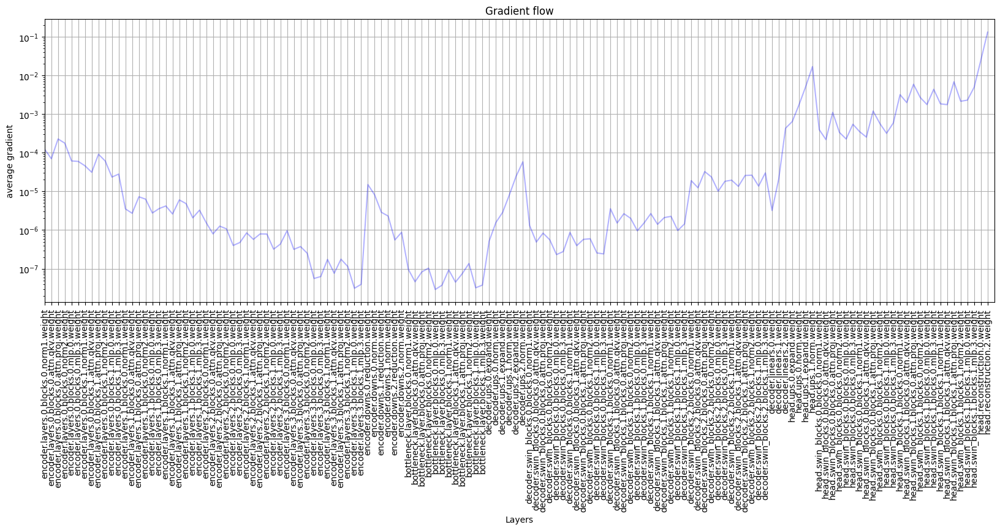

In [23]:
plot_grad_flow(upscaler.named_parameters())

tensor(10.2542)


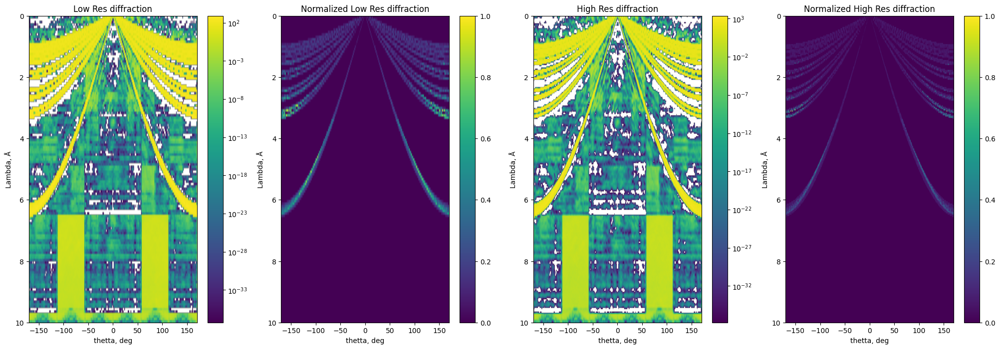

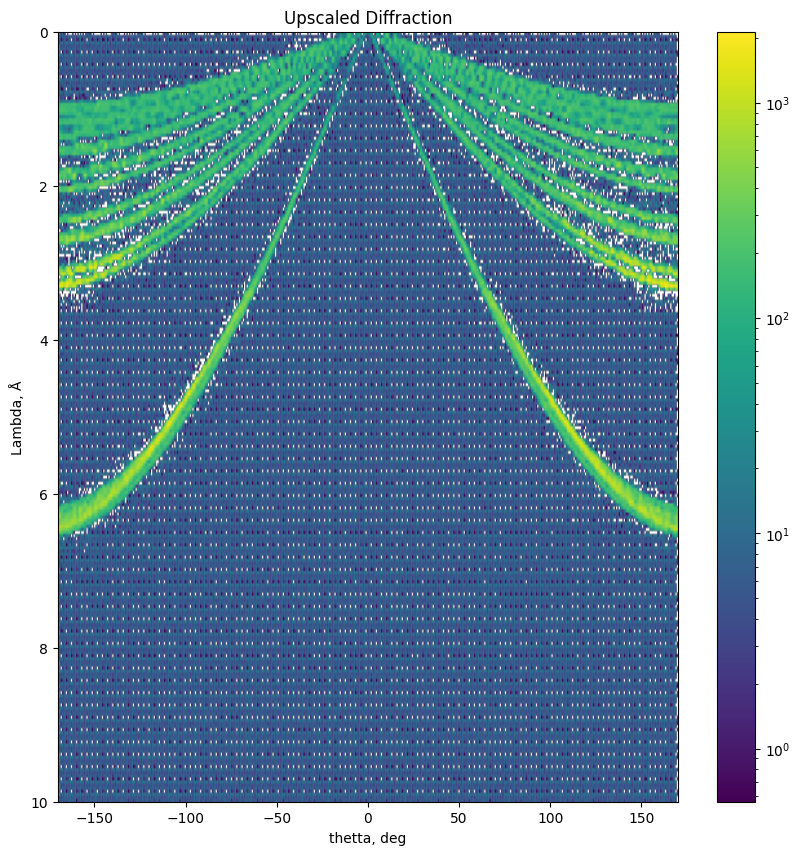

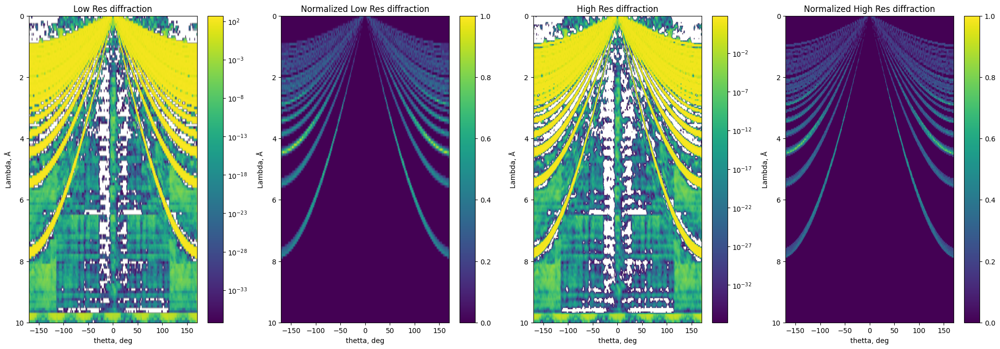

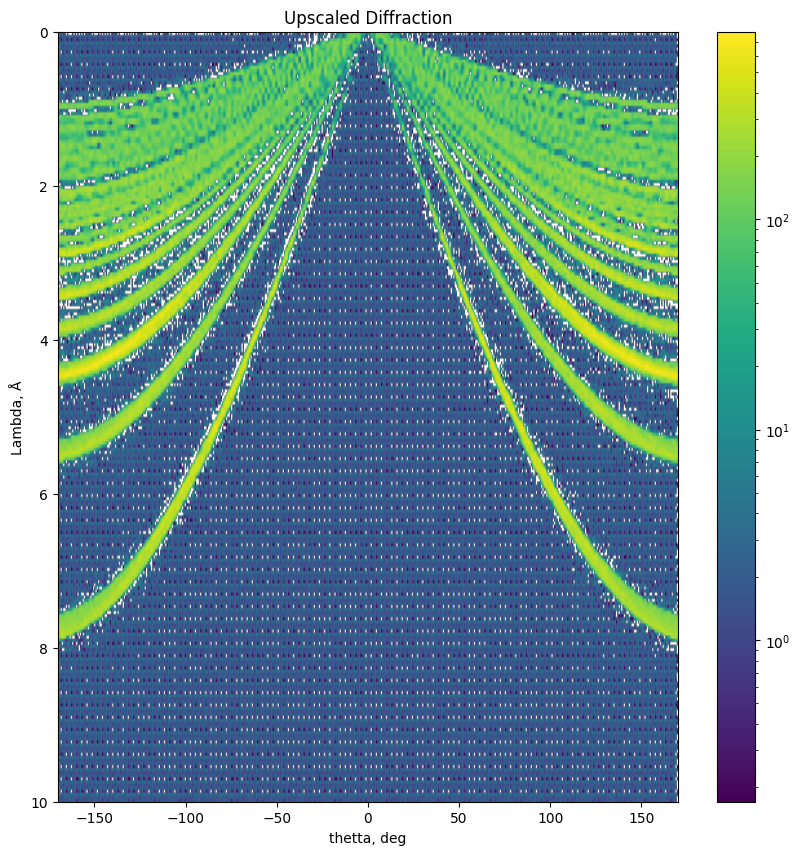

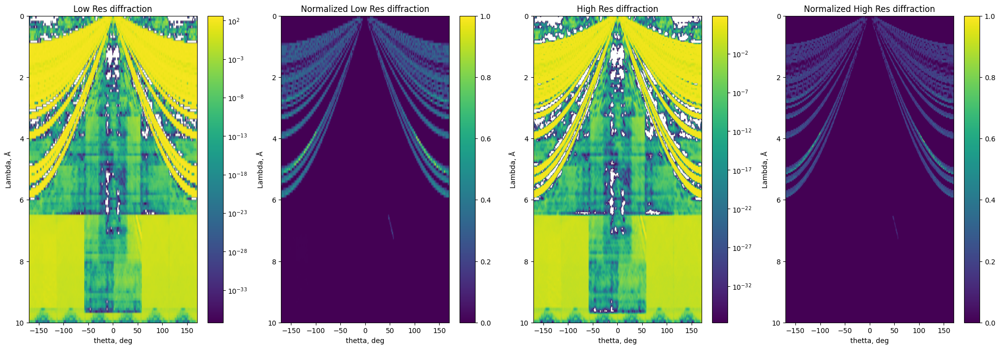

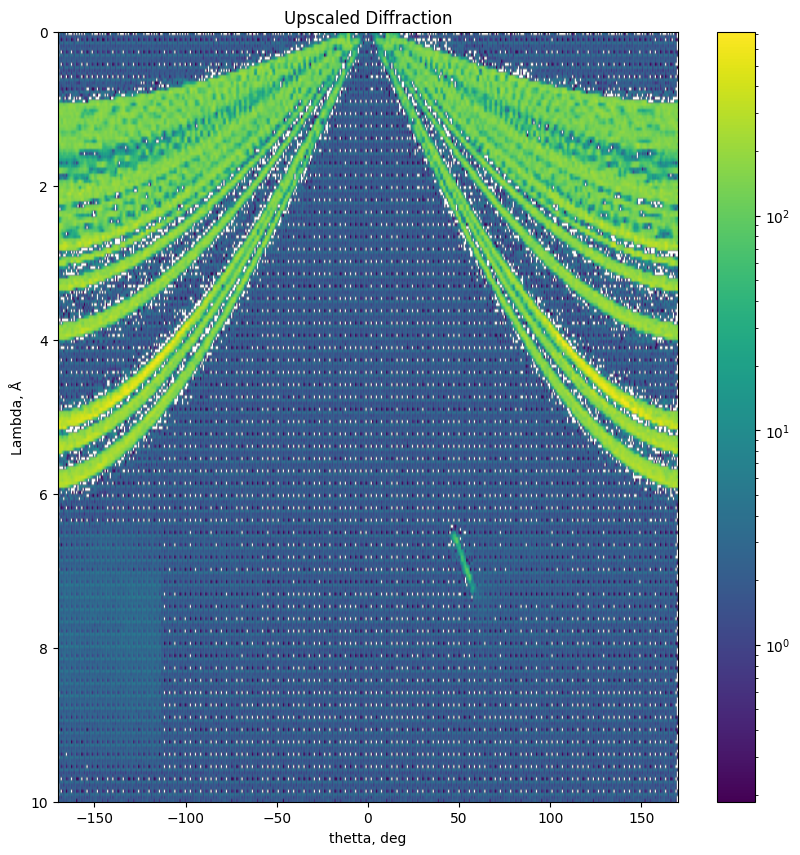

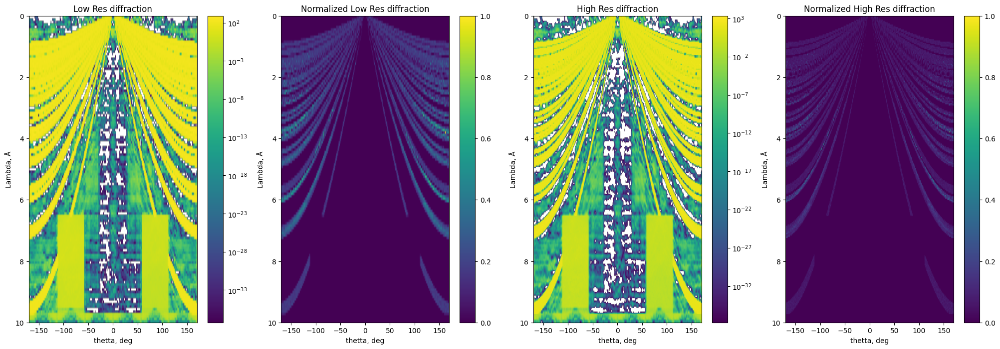

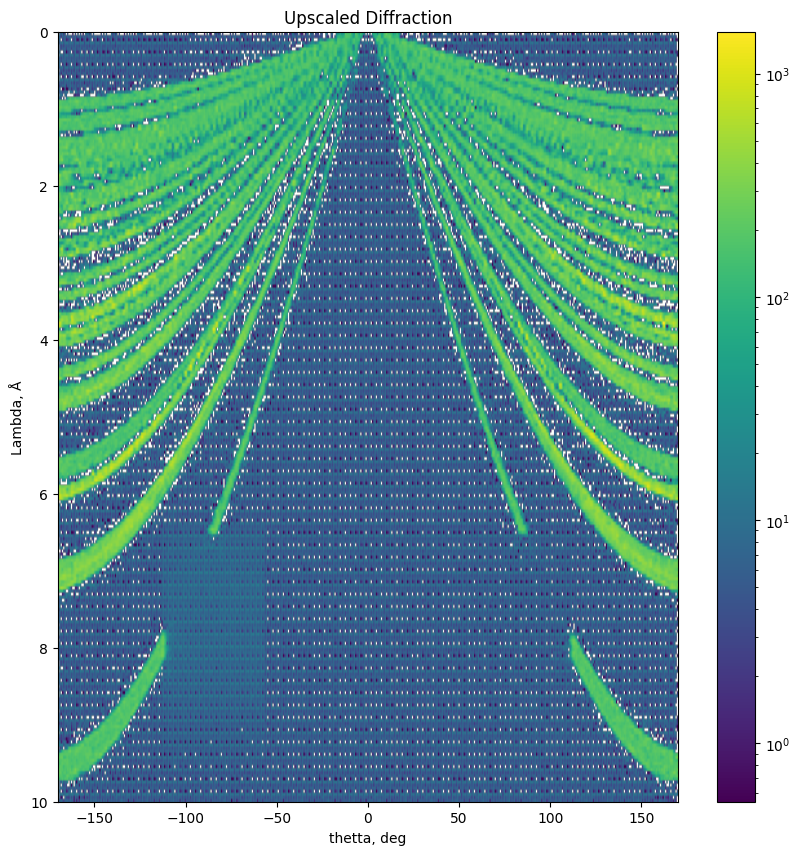

In [24]:
# Валидация
upscaler.eval()

lambda_phys = 1.0
with torch.no_grad():
    for hr, _ in test_loader:
        hr = hr.to(device)

        mu = 100
        sigma = 0.2*mu
        
        # Создаем шум на том же устройстве
        noise = torch.randn_like(hr, device=device) * sigma + mu
        hr = hr + noise

        if use_fp16:
            # FP16 forward
            with autocast():
                pred = segmentator(hr)
                pred = torch.sigmoid(pred)       
        else:
            pred = segmentator(hr)
            pred = torch.sigmoid(pred)

        hr = pred * hr

        lr = F.interpolate(
            hr, 
            scale_factor=0.5, 
            mode='bilinear', 
            align_corners=False
        )  # размер: [32, 1, 125, 240]
        
        norm_lr, params_lr = normalize_piecewise(lr)

        norm_hr, params_hr = normalize_piecewise(hr)

        if use_fp16:
            # FP16 forward
            with autocast():
                pred = upscaler(norm_lr.to(device))  # pred shape B,1,250*scale? model uses scale, so pred is HR sized
                # ensure shapes match
                # If pred size differs, you may need to crop/pad depending on patch_size
                rec = l1_loss(pred, norm_hr.to(device))
                denorm_pred = denormalize_piecewise(pred, params_hr)

                loss_peaks = pipe(
                    batch_pred_2d=denorm_pred,     # предсказанная 2D дифракция
                    batch_true_2d=lr,     # ground-truth 2D
                    peak_params_pred={"scale": True},
                    peak_params_true={"scale": False},
                    tol=0.05
                )
                if rec.item() >= 0.06:
                    loss = rec
                else:
                    loss = rec + lambda_phys * loss_peaks

        else:
            # FP32 forward
            pred = upscaler(norm_lr.to(device))  # pred shape B,1,250*scale? model uses scale, so pred is HR sized
            # ensure shapes match
            # If pred size differs, you may need to crop/pad depending on patch_size
            rec = l1_loss(pred, norm_hr.to(device))
            denorm_pred = denormalize_piecewise(pred, params_hr)

            loss_peaks = pipe(
                batch_pred_2d=denorm_pred,     # предсказанная 2D дифракция
                batch_true_2d=lr,     # ground-truth 2D
                peak_params_pred={"scale": True},
                peak_params_true={"scale": False},
                tol=0.05
            )
            if rec.item() >= 0.06:
                loss = rec
            else:
                loss = rec + lambda_phys * loss_peaks

        print(loss_peaks)

        for i in range(len(lr)):
            # Создаем фигуру и оси
            fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(25, 8))

            # Первый график
            im1 = ax1.imshow(lr[i][0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
            ax1.set_title("Low Res diffraction")
            ax1.set_xlabel('thetta, deg')
            ax1.set_ylabel('Lambda, Å')
            plt.colorbar(im1)

            # Первый график
            im2 = ax2.imshow(norm_lr[i][0].cpu().numpy(), cmap='viridis', aspect='auto', extent=(-170, 170, 10, 0))
            ax2.set_title("Normalized Low Res diffraction")
            ax2.set_xlabel('thetta, deg')
            ax2.set_ylabel('Lambda, Å')
            plt.colorbar(im2)

            # Первый график
            im3 = ax3.imshow(hr[i][0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
            ax3.set_title("High Res diffraction")
            ax3.set_xlabel('thetta, deg')
            ax3.set_ylabel('Lambda, Å')
            plt.colorbar(im3)

            # Первый график
            im4 = ax4.imshow(norm_hr[i][0].cpu().numpy(), cmap='viridis', aspect='auto', extent=(-170, 170, 10, 0))
            ax4.set_title("Normalized High Res diffraction")
            ax4.set_xlabel('thetta, deg')
            ax4.set_ylabel('Lambda, Å')
            plt.colorbar(im4)

            plt.figure(figsize=(10, 10))
            plt.imshow(denorm_pred[i][0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
            plt.title("Upscaled Diffraction")
            plt.xlabel('thetta, deg')
            plt.ylabel('Lambda, Å')
            plt.colorbar()
            plt.show()

        break

In [25]:
import torch

class Qwrapper:
    def __init__(self, theta_range=(-170, 170), L_range=(0.1, 10), fixed_centers=None, device="cuda"):
        self.theta_range = theta_range
        self.L_range = L_range
        self.device = device

        if fixed_centers is None:
            raise ValueError("Нужно передать фиксированные центры каналов d.")

        centers = torch.tensor(fixed_centers, dtype=torch.float32)
        self.centers = centers.to(device)

        # Строим границы каналов
        edges = torch.zeros(len(centers) + 1, dtype=torch.float32)

        edges[1:-1] = (centers[:-1] + centers[1:]) * 0.5
        edges[0] = centers[0] - (centers[1] - centers[0]) * 0.5
        edges[-1] = centers[-1] + (centers[-1] - centers[-2]) * 0.5

        self.edges = edges.to(device)


    def tensor_to_d(self, batch_tensor):
        if batch_tensor.dim() != 4:
            raise ValueError("Ожидается тензор размера [B, 1, H, W]")

        B, _, H, W = batch_tensor.shape
        batch_tensor = batch_tensor.to(self.device)

        # формируем theta и L (Правильно!)
        theta_deg = torch.linspace(self.theta_range[0], self.theta_range[1], W, device=self.device)
        L_vals = torch.linspace(self.L_range[0], self.L_range[1], H, device=self.device)

        theta_rad = torch.deg2rad(theta_deg)  # [W]

        # meshgrid правильно: (H, W)
        # L зависит от строки, theta зависит от столбца
        L_grid, theta_grid = torch.meshgrid(L_vals, theta_rad, indexing="ij")
        # теперь:
        # L_grid:     [H, W]
        # theta_grid: [H, W]

        # вычисляем d
        d_grid = L_grid / (2 * torch.sin(torch.abs(theta_grid) * 0.5))

        # маска d <= 7.5
        mask = d_grid <= 7.5  # [H, W]

        results = []

        for b in range(B):
            I_mat = batch_tensor[b, 0]  # [H, W]

            # применяем маску
            d_vals = d_grid[mask]       # [N]
            I_vals = I_mat[mask]        # [N]

            # определяем индекс канала
            idx = torch.bucketize(d_vals, self.edges) - 1

            I_summed = torch.zeros(len(self.centers), device=self.device)
            I_summed.scatter_add_(0, idx.clamp(0, len(I_summed) - 1), I_vals)

            results.append({
                "d": self.centers.detach().cpu().numpy(),
                "I": I_summed.detach().cpu().numpy()
            })

        return results


tensor(8.9354)


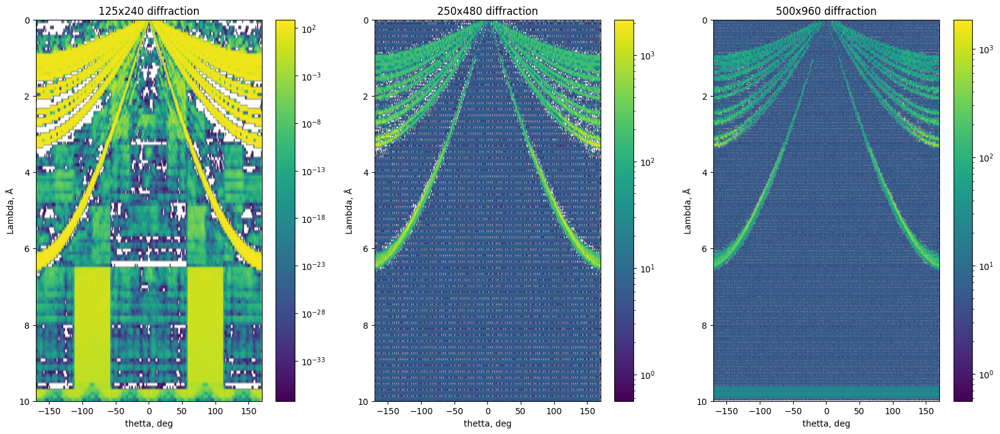

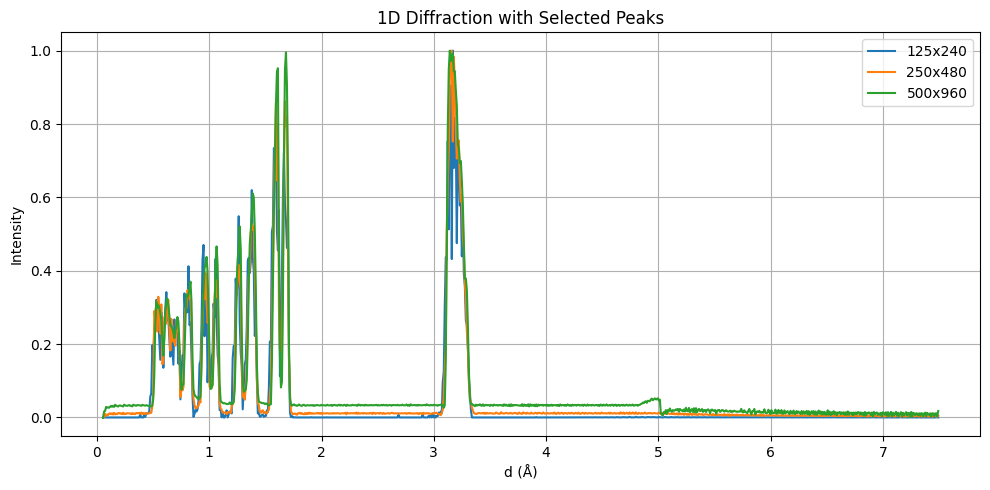

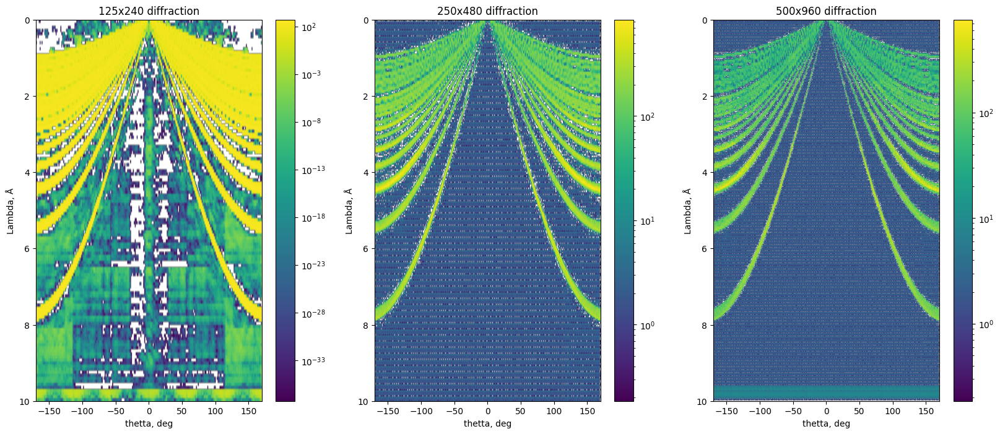

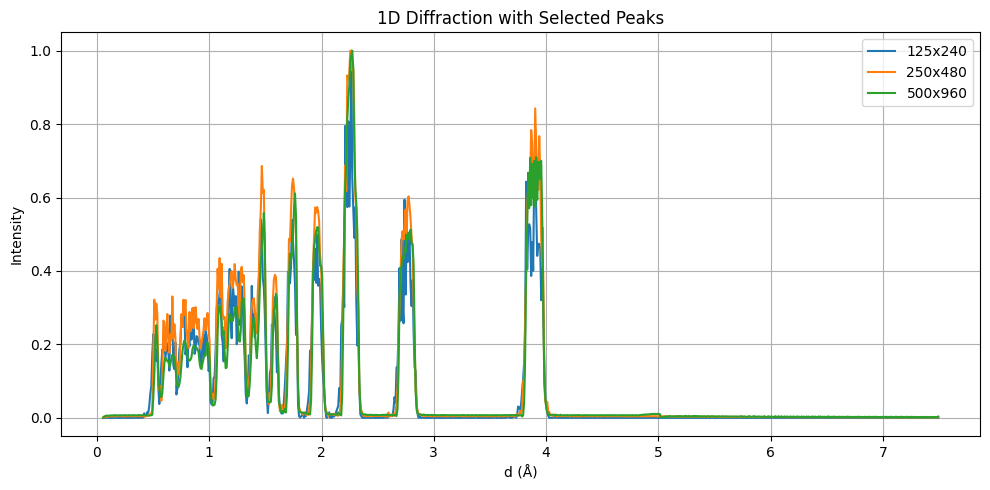

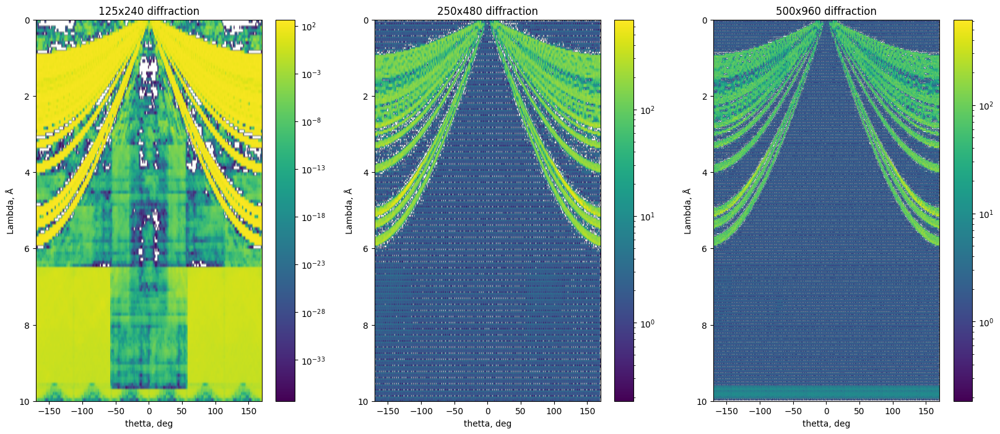

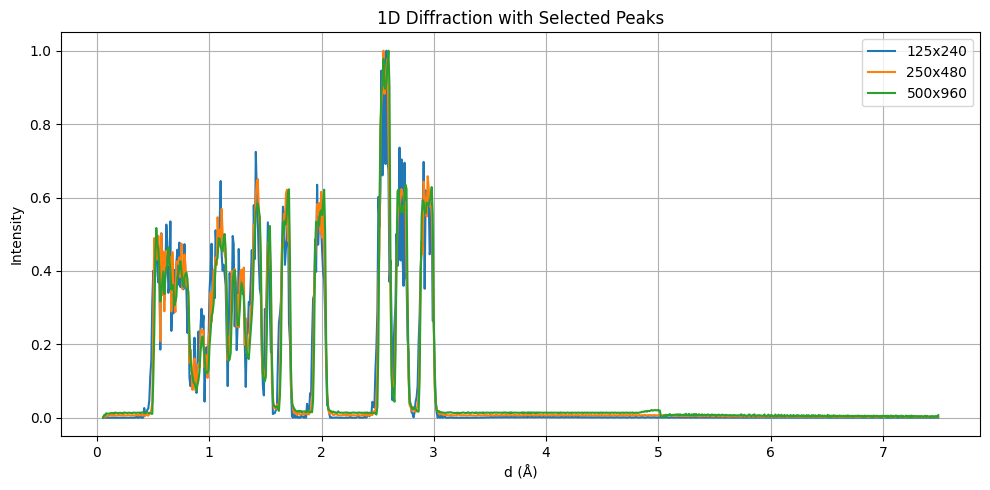

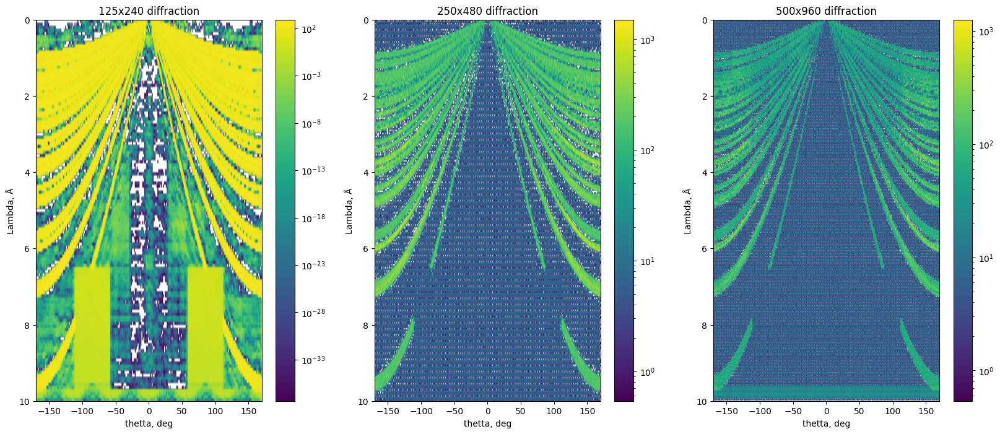

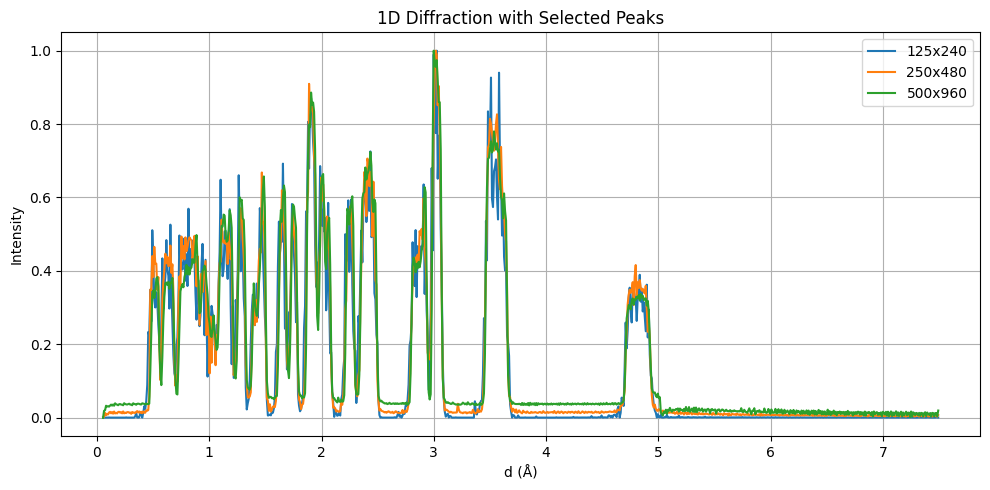

In [26]:
fixed_centers = np.linspace(0.05318052, 7.49710258, 1241)
fixed_centers1 = np.linspace(0.0546658, 7.49180085, 832)

qw = Qwrapper(
    theta_range=(-170, 170),
    L_range=(0.1, 10),
    fixed_centers=fixed_centers1,
    device = "cpu"
)

upscaler.eval()

with torch.no_grad():
    for hr, _ in test_loader:
        hr = hr.to(device)

        mu = 100
        sigma = 0.2*mu
        
        # Создаем шум на том же устройстве
        noise = torch.randn_like(hr, device=device) * sigma + mu
        hr = hr + noise

        if use_fp16:
            # FP16 forward
            with autocast():
                pred = segmentator(hr)
                pred = torch.sigmoid(pred)       
        else:
            pred = segmentator(hr)
            pred = torch.sigmoid(pred)

        hr = pred * hr

        lr = F.interpolate(
            hr, 
            scale_factor=0.5, 
            mode='bilinear', 
            align_corners=False
        )  # размер: [32, 1, 125, 240]
        
        norm_lr, params_lr = normalize_piecewise(lr)
        denorm_lr = denormalize_piecewise(norm_lr, params_lr)

        norm_hr, params_hr = normalize_piecewise(hr)
        denorm_hr = denormalize_piecewise(norm_hr, params_hr)

        if use_fp16:
            # FP16 forward
            with autocast():
                pred = upscaler(norm_lr.to(device))  # pred shape B,1,250*scale? model uses scale, so pred is HR sized
                pred1 = upscaler(norm_hr.to(device))
        else:
            pred = upscaler(norm_lr.to(device))  # pred shape B,1,250*scale? model uses scale, so pred is HR sized
            pred1 = upscaler(norm_hr.to(device))
        

        denorm_pred = denormalize_piecewise(pred, params_hr)
        denorm_pred1 = denormalize_piecewise(pred1, params_hr)

        loss_peaks = pipe(
            batch_pred_2d=denorm_pred,     # предсказанная 2D дифракция
            batch_true_2d=lr,     # ground-truth 2D
            peak_params_pred={"scale": True},
            peak_params_true={"scale": False},
            tol=0.05
        )

        print(loss_peaks)

        out1 = qw.tensor_to_d(lr)
        out2 = qw.tensor_to_d(denorm_pred)
        out3 = qw.tensor_to_d(denorm_pred1)

        for i in range(len(lr)):
            # Создаем фигуру и оси
            fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 8))

            # Первый график
            im1 = ax1.imshow(lr[i][0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
            ax1.set_title("125x240 diffraction")
            ax1.set_xlabel('thetta, deg')
            ax1.set_ylabel('Lambda, Å')
            plt.colorbar(im1)

            # Первый график
            im2 = ax2.imshow(denorm_pred[i][0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
            ax2.set_title("250x480 diffraction")
            ax2.set_xlabel('thetta, deg')
            ax2.set_ylabel('Lambda, Å')
            plt.colorbar(im2)

            # Первый график
            im3 = ax3.imshow(denorm_pred1[i][0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log', extent=(-170, 170, 10, 0))
            ax3.set_title("500x960 diffraction")
            ax3.set_xlabel('thetta, deg')
            ax3.set_ylabel('Lambda, Å')
            plt.colorbar(im3)

            plt.show()

            # Plot overall diffraction pattern
            plt.figure(figsize=(10, 5))
            plt.plot(out1[i]["d"], out1[i]["I"] / max(out1[i]["I"]), label='125x240')
            plt.plot(out2[i]["d"], out2[i]["I"] / max(out2[i]["I"]), label='250x480')
            plt.plot(out3[i]["d"], out3[i]["I"] / max(out3[i]["I"]), label='500x960')
            plt.xlabel("d (Å)")
            plt.ylabel("Intensity")
            plt.title("1D Diffraction with Selected Peaks")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()

        break


In [ ]:
# допустим, твоя текущая модель называется vae
save_path = "../models/SwinUnetSR_upscaler_for_segmented_diffraction.pth"
torch.save(upscaler.state_dict(), save_path)
print(f"✅ Модель сохранена в {save_path}")

✅ Модель сохранена в models/SwinUnetSR_upscaler_for_segmented_diffraction.pth


In [ ]:
from SwinUNet import SwinUNetSR

upscaler = SwinUNetSR(patch_size=2, in_chans=1, embed_dim=48, depths=[2, 2, 2, 2], num_heads=[3, 6, 12, 24],
                 window_size=5, mlp_ratio=4., qkv_bias=True, drop=0., attn_drop=0., drop_path=0.).to(device)

upscaler.load_state_dict(torch.load("../models/SwinUnetSR_upscaler_for_segmented_diffraction.pth", map_location=device))

<All keys matched successfully>

In [17]:
import torch
from torchmetrics.image import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure
from tqdm import tqdm

# Инициализируем метрики
psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)  # data_range=1.0 для диапазона [0, 1]
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

use_fp16 = True

# Validation
upscaler.eval()
PSNRs = []
SSIMs = []
peak_losses = []
num_val_iterations = 5
with torch.no_grad():
    for _ in range(num_val_iterations):
        for hr, _ in tqdm(test_loader):
            hr = hr.to(device)

            mu = 100
            sigma = 0.2*mu
            
            # Создаем шум на том же устройстве
            noise = torch.randn_like(hr, device=device) * sigma + mu
            hr = hr + noise

            if use_fp16:
                # FP16 forward
                with torch.cuda.amp.autocast():
                    pred = segmentator(hr)
                    pred = torch.sigmoid(pred)       
            else:
                pred = segmentator(hr)
                pred = torch.sigmoid(pred)

            hr = pred * hr

            lr = F.interpolate(
                hr, 
                scale_factor=0.5, 
                mode='bilinear', 
                align_corners=False
            )  # размер: [32, 1, 125, 240]
            
            norm_lr, params_lr = normalize_piecewise(lr)
            denorm_lr = denormalize_piecewise(norm_lr, params_lr)

            norm_hr, params_hr = normalize_piecewise(hr)
            denorm_hr = denormalize_piecewise(norm_hr, params_hr)

            if use_fp16:
                # FP16 forward
                with torch.cuda.amp.autocast():
                    pred = upscaler(norm_lr.to(device))  # pred shape B,1,250*scale? model uses scale, so pred is HR sized

            else:
                pred = upscaler(norm_lr.to(device))  # pred shape B,1,250*scale? model uses scale, so pred is HR sized

            
            denorm_pred = denormalize_piecewise(pred, params_hr)

            for i, (gt_normed_diffraction, pred_normed_diffraction) in enumerate(zip(norm_hr, pred)):

                gt_normed_diffraction = gt_normed_diffraction.unsqueeze(0).to(device)
                pred_normed_diffraction = pred_normed_diffraction.unsqueeze(0).to(device)

                # Вычисляем метрики
                psnr_value = psnr_metric(gt_normed_diffraction, pred_normed_diffraction) # img_pred, img_gt
                ssim_value = ssim_metric(gt_normed_diffraction, pred_normed_diffraction)

                PSNRs.append(psnr_value.cpu().item())
                SSIMs.append(ssim_value.cpu().item())

                loss_peaks = pipe(
                    batch_pred_2d=denorm_pred[i].unsqueeze(0),     # предсказанная 2D дифракция
                    batch_true_2d=lr[i].unsqueeze(0),     # ground-truth 2D
                    peak_params_pred={"scale": True},
                    peak_params_true={"scale": False},
                    tol=0.05
                )

                peak_losses.append(loss_peaks.cpu().item())

100%|██████████| 60/60 [00:04<00:00, 13.51it/s]


In [ ]:
import json

with open("../results/SwinUnetSR_pretrain_upscaling_metrics.json", "w", encoding="utf-8") as f:
    json.dump(
        {
            "PSNRs": PSNRs,
            "SSIMs": SSIMs,
            "peak_losses": peak_losses
        },
        f,
        indent=4,
        ensure_ascii=False
    )

In [ ]:
with open("../results/SwinUnetSR_pretrain_upscaling_metrics.json", "r", encoding="utf-8") as f:
    data = json.load(f)

PSNRs = data["PSNRs"]
SSIMs = data["SSIMs"]
peak_losses = data["peak_losses"]


In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Предполагаем, что у вас уже есть массивы:
# PSNRs, SSIMs, peak_losses - списки или numpy массивы

# 1. Расчет среднего и стандартного отклонения
def calculate_statistics(data, metric_name):
    """Вычисляет среднее и стандартное отклонение"""
    mean_val = np.mean(data)
    std_val = np.std(data, ddof=1)  # ddof=1 для несмещенной оценки
    
    print(f"{metric_name}:")
    print(f"  Среднее: {mean_val:.4f}")
    print(f"  СКО: {std_val:.4f}")
    print(f"  Минимум: {np.min(data):.4f}")
    print(f"  Максимум: {np.max(data):.4f}")
    print(f"  Количество образцов: {len(data)}")
    print("-" * 40)
    
    return mean_val, std_val

# Вычисляем статистики для всех метрик
psnr_mean, psnr_std = calculate_statistics(PSNRs, "PSNR (dB)")
ssim_mean, ssim_std = calculate_statistics(SSIMs, "SSIM")
peak_mean, peak_std = calculate_statistics(peak_losses, "Peak Loss")

PSNR (dB):
  Среднее: 32.8978
  СКО: 3.6050
  Минимум: 21.8752
  Максимум: 44.8326
  Количество образцов: 1200
----------------------------------------
SSIM:
  Среднее: 0.9142
  СКО: 0.0192
  Минимум: 0.5576
  Максимум: 0.9743
  Количество образцов: 1200
----------------------------------------
Peak Loss:
  Среднее: 1.6669
  СКО: 1.4770
  Минимум: 0.0000
  Максимум: 9.8938
  Количество образцов: 1200
----------------------------------------


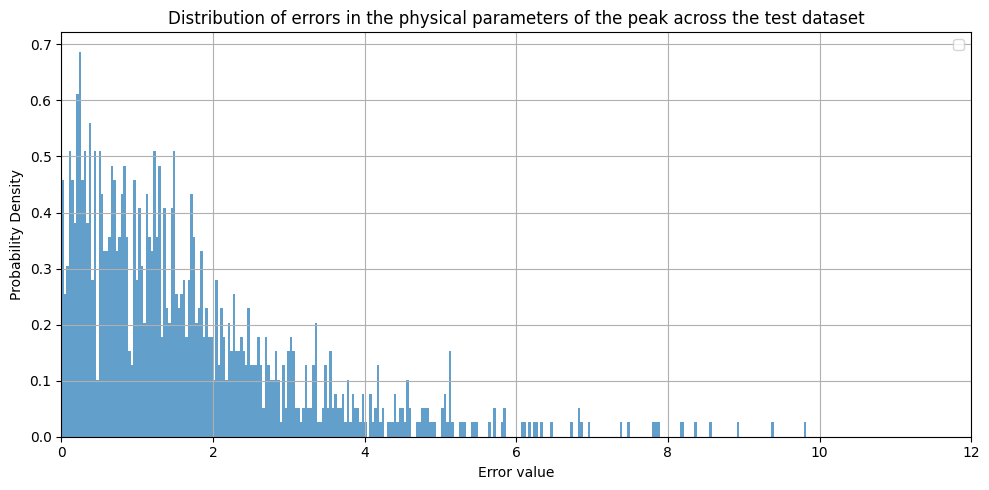

In [28]:
plt.figure(figsize=(10, 5))
plt.hist(peak_losses, alpha=0.7, bins=300, density=True)
plt.xlim(0,12)
plt.xlabel("Error value")
plt.ylabel("Probability Density")
plt.title("Distribution of errors in the physical parameters of the peak across the test dataset")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [23]:
import torch
from tqdm import tqdm
import torch.nn as nn


use_fp16 = True
pool = nn.AvgPool2d(kernel_size=2, stride=2).to(device)

# Validation
upscaler.eval()
peak_losses_avg_pool = []
num_val_iterations = 5
with torch.no_grad():
    for _ in range(num_val_iterations):
        for hr, _ in tqdm(test_loader):
            hr = hr.to(device)

            mu = 100
            sigma = 0.2*mu
            
            # Создаем шум на том же устройстве
            noise = torch.randn_like(hr, device=device) * sigma + mu
            hr = hr + noise

            if use_fp16:
                # FP16 forward
                with torch.cuda.amp.autocast():
                    pred = segmentator(hr)
                    pred = torch.sigmoid(pred)       
            else:
                pred = segmentator(hr)
                pred = torch.sigmoid(pred)

            hr = pred * hr

            lr = pool(hr)  # размер: [32, 1, 125, 240]
        

            for i, (gt_diffraction, pooled_diffraction) in enumerate(zip(hr, lr)):

                gt_diffraction = gt_diffraction.unsqueeze(0).to(device)
                pooled_diffraction = pooled_diffraction.unsqueeze(0).to(device)

                loss_peaks = pipe(
                    batch_pred_2d=gt_diffraction,     # предсказанная 2D дифракция
                    batch_true_2d=pooled_diffraction,     # ground-truth 2D
                    peak_params_pred={"scale": True},
                    peak_params_true={"scale": False},
                    tol=0.05
                )

                peak_losses_avg_pool.append(loss_peaks.cpu().item())

100%|██████████| 60/60 [00:02<00:00, 25.48it/s]


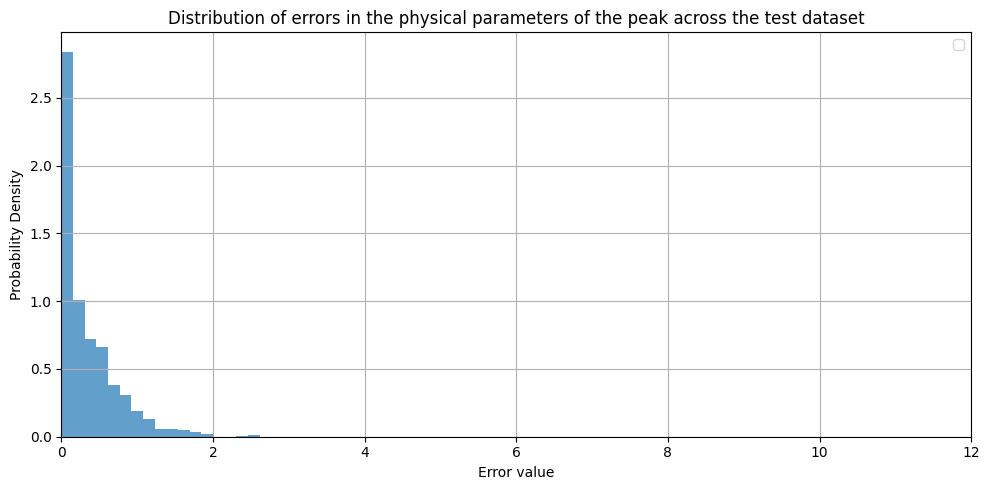

In [24]:
plt.figure(figsize=(10, 5))
plt.hist(peak_losses_avg_pool, alpha=0.7, bins=300, density=True)
plt.xlim(0,12)
plt.xlabel("Error value")
plt.ylabel("Probability Density")
plt.title("Distribution of errors in the physical parameters of the peak across the test dataset")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import json

with open("../results/AGVpool_peak_losses.json", "w", encoding="utf-8") as f:
    json.dump(
        {
            "peak_losses_avg_pool": peak_losses_avg_pool
        },
        f,
        indent=4,
        ensure_ascii=False
    )